In [1]:
import numpy as np
import os
import pickle

from matplotlib import pyplot as plt 

from steves_utils.stratified_dataset.traditional_accessor import Traditional_Accessor_Factory

from steves_utils.utils_v2 import get_datasets_base_path

In [2]:
N=100

In [3]:
# pickle_path = "oracle.Run1_framed_1300Examples_stratified_ds.2022A.pkl"
pickle_path = "oracle.Run1_framed_2000Examples_stratified_ds.2022A.pkl"
# pickle_path = "cores.stratified_ds.2022A.pkl"

with open(os.path.join(get_datasets_base_path(), pickle_path), "rb") as f:
    p = pickle.load(f)

In [4]:
print(p['data'].keys())

dict_keys([32, 38, 8, 44, 14, 50, 20, 26])


In [5]:
from steves_utils.ORACLE.utils_v2 import (
    ALL_DISTANCES_FEET_NARROWED,
    ALL_RUNS,
    ALL_SERIAL_NUMBERS,
    SERIAL_NUMBER_MAPPING,
)

ds = {}
for u in sorted(p["data"].keys()):
    ds[u] = {}
    for y,X in p["data"][u].items():
        if u != 20 or y != "3123D52": continue
        selected = np.random.default_rng(1337).choice(X, N, False)
        selected = [np.apply_along_axis(lambda args: [complex(*args)], 1, x.T).flatten() for x in selected]
#         ds[u][SERIAL_NUMBER_MAPPING[y]] = selected
        ds[u][y] = selected

100


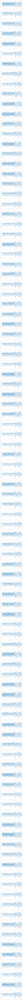

In [6]:
plt.figure(figsize=(15,700))

count = 0
for u in ds:
    for y,X in ds[u].items():
        count += len(X)

print(count)
        
i = 1
for u in ds:
    for y,X in ds[u].items():
        for x in X:
            ax  = plt.subplot(count,1,i)
            ax.plot(range(len(x)),np.abs(x))
            i += 1